In [ ]:
%pip install missingno

In [ ]:
%pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.5/357.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 40.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=3be677dbd9439bf45acbe381854d1cae82adc6a5511247dd59b299cafb667af0
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
   

In [ ]:
import missingno as msno
from ydata_profiling import ProfileReport

In [ ]:
from sklearn.preprocessing import LabelEncoder # convierte el texto a numeros
from sklearn.svm import SVC #maquina soporte vectorial
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score, recall_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
import seaborn as sns
import numpy as np
import pandas as pd
from joblib import dump, load

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/datasets/datasets_pandas_scikit_learn_spark-master/breast-cancer-wisconsin_train.csv', sep=',', header=0)
df.head()

,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,5,1,1,1,2.0,1,3,1,1,Benign
1,5,4,4,5,7.0,10,3,2,1,Benign
2,3,1,1,1,2.0,2,3,1,1,Benign
3,6,8,8,1,3.0,4,3,7,1,Benign
4,4,1,1,3,2.0,1,3,1,1,Benign


In [ ]:
df.dtypes

Clump Thickness                 object
Uniformity of Cell Size          int64
Uniformity of Cell Shape        object
Marginal Adhesion               object
Single Epithelial Cell Size    float64
Bare Nuclei                     object
Bland Chromatin                 object
Normal Nucleoli                  int64
Mitoses                         object
Class                           object
dtype: object

In [ ]:
for columna in df.columns:
    print(columna)
    dfp = pd.to_numeric(df[columna], errors="coerce")
    ix_pos = dfp.isna()
    print(df[ix_pos])
    print()

Clump Thickness
   Clump Thickness  Uniformity of Cell Size Uniformity of Cell Shape  \
82                                        2                        1   
87                                        6                        6   
95             NaN                        1                        1   

   Marginal Adhesion  Single Epithelial Cell Size Bare Nuclei Bland Chromatin  \
82                 1                          2.0           1               3   
87                 6                          5.0          10               6   
95                 1                          2.0         NaN               3   

    Normal Nucleoli Mitoses      Class  
82                1       1     Benign  
87                8       3  malignant  
95                1       1        NaN  

Uniformity of Cell Size
Empty DataFrame
Columns: [Clump Thickness, Uniformity of Cell Size, Uniformity of Cell Shape, Marginal Adhesion, Single Epithelial Cell Size, Bare Nuclei, Bland Chromatin, Normal Nu

In [ ]:
hp = {"Clump Thickness": {"NaN":0}}
df = df.replace(hp)
df["Clump Thickness"] = pd.to_numeric(df["Clump Thickness"])

hp = {"Uniformity of Cell Shape": {"?":0," ":0}}
df = df.replace(hp)
df["Uniformity of Cell Shape"] = pd.to_numeric(df["Uniformity of Cell Shape"])

hp = {"Marginal Adhesion": {"NaN":0," ":0}}
df = df.replace(hp)
df["Marginal Adhesion"] = pd.to_numeric(df["Marginal Adhesion"])

hp = {"Single Epithelial Cell Size": {"NaN":0}}
df = df.replace(hp)
df["Single Epithelial Cell Size"] = pd.to_numeric(df["Single Epithelial Cell Size"])

df["Bare Nuclei"] = df["Bare Nuclei"].replace(['*', '?', 'Nan', ' '],0)
df["Bare Nuclei"] = pd.to_numeric(df["Bare Nuclei"])

hp = {"Bland Chromatin": {" ":0}}
df = df.replace(hp)
df["Bland Chromatin"] = pd.to_numeric(df["Bland Chromatin"])

hp = {"Mitoses": {" ":0}}
df = df.replace(hp)
df["Mitoses"] = pd.to_numeric(df["Mitoses"])

In [ ]:
df.dtypes

Clump Thickness                float64
Uniformity of Cell Size          int64
Uniformity of Cell Shape         int64
Marginal Adhesion              float64
Single Epithelial Cell Size    float64
Bare Nuclei                    float64
Bland Chromatin                  int64
Normal Nucleoli                  int64
Mitoses                          int64
Class                           object
dtype: object

<Axes: >

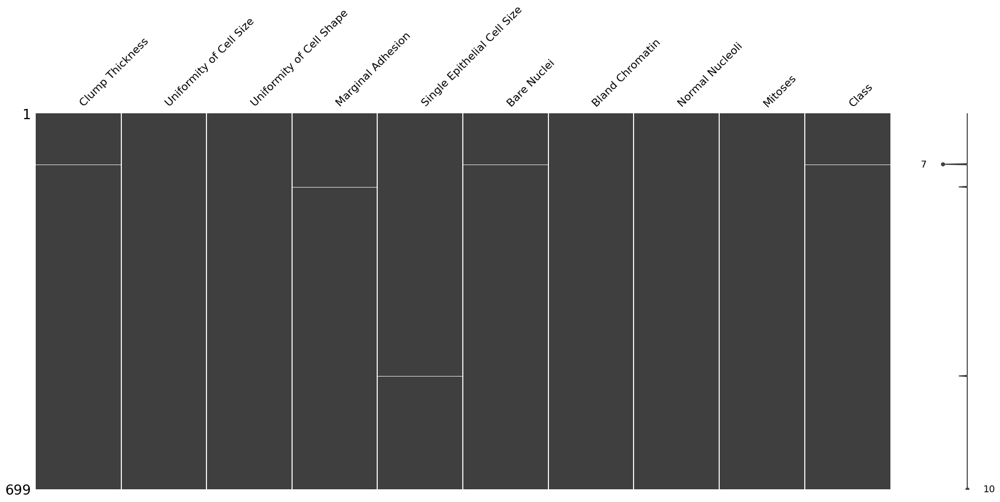

In [ ]:
msno.matrix(df)

<Axes: >

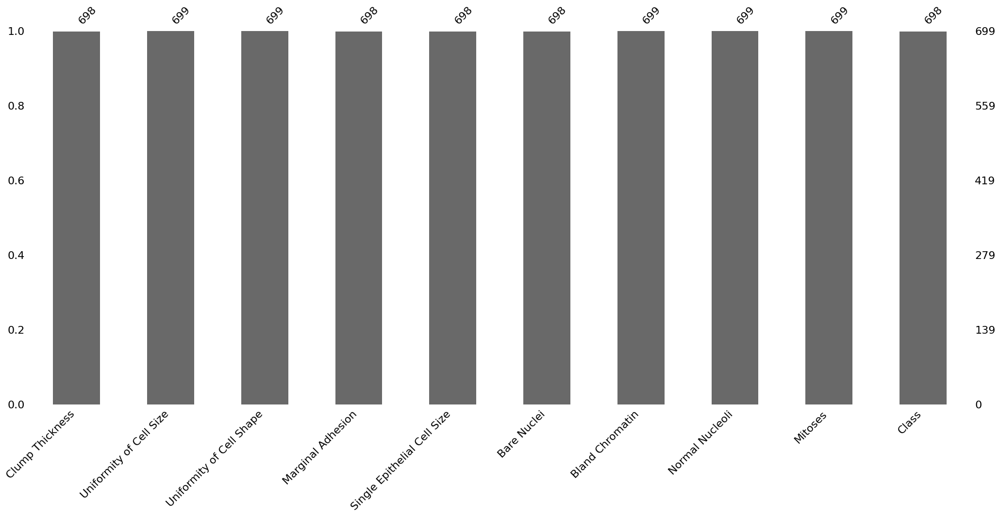

In [ ]:
msno.bar(df)

In [ ]:
df.dropna(inplace=True)

df.isnull().sum()

Clump Thickness                0
Uniformity of Cell Size        0
Uniformity of Cell Shape       0
Marginal Adhesion              0
Single Epithelial Cell Size    0
Bare Nuclei                    0
Bland Chromatin                0
Normal Nucleoli                0
Mitoses                        0
Class                          0
dtype: int64

In [ ]:
profile = ProfileReport(df, title='Profiling Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
features = ['Clump Thickness',	'Uniformity of Cell Size',	'Uniformity of Cell Shape',	'Marginal Adhesion', 'Single Epithelial Cell Size','Bare Nuclei','Bland Chromatin','Normal Nucleoli','Mitoses']
label = 'Class'

In [ ]:
le31 = LabelEncoder()
df['clase'] = le31.fit_transform(df[label])
dump(le31, 'le31.joblib')

['le31.joblib']

In [ ]:
df.head()

,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class,clase
0,5.0,1,1,1.0,2.0,1.0,3,1,1,Benign,0
1,5.0,4,4,5.0,7.0,10.0,3,2,1,Benign,0
2,3.0,1,1,1.0,2.0,2.0,3,1,1,Benign,0
3,6.0,8,8,1.0,3.0,4.0,3,7,1,Benign,0
4,4.0,1,1,3.0,2.0,1.0,3,1,1,Benign,0


In [ ]:
df.Class.value_counts()

Benign       456
malignant    240
Name: Class, dtype: int64

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(df[features], df.clase, test_size=0.20, random_state=0, stratify=df.clase)

class_weights = len(ytrain) / (len(np.unique(ytrain)) * np.bincount(ytrain))
sample_weights = class_weights[ytrain]

In [ ]:
print(xtrain.shape)
print(xtest.shape)
print(len(ytrain))
print(len(ytest))

(556, 9)
(140, 9)
556
140


In [ ]:
ytrain.value_counts()

0    364
1    192
Name: clase, dtype: int64

# SVC Maquina de soporte vectorial

In [ ]:
svm = SVC(probability=True, class_weight='balanced')
modelo = svm.fit(xtrain, ytrain) # sample_weight=sample_weights
prediccion = modelo.predict(xtest)

In [ ]:
prediccion
# ytest = prediccion
prediccion_list = prediccion.tolist()
ytest_lista = ytest.tolist()
i = 0
for p in prediccion_list:
  print(p, ytest_lista[i])
  i += 1

Benign       456
malignant    240
Name: Class, dtype: int64

score:  0.9642857142857143
recall_score:  0.9642857142857143
accuracy_score:  0.9642857142857143
f1_score:  0.9642857142857143

classification_report: 
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        87
           1       1.00      0.91      0.95        53

    accuracy                           0.96       140
   macro avg       0.97      0.95      0.96       140
weighted avg       0.97      0.96      0.96       140



<Axes: >

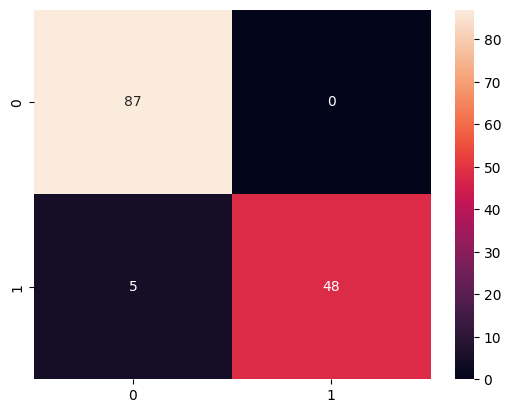

In [ ]:
print(df[label].value_counts())
print()
print('score: ',modelo.score(xtest, ytest))

print('recall_score: ',recall_score(prediccion,ytest, average='micro'))
print('accuracy_score: ',accuracy_score(prediccion,ytest))
print('f1_score: ',f1_score(prediccion,ytest, average='micro'))
print()
print('classification_report: ',classification_report(prediccion,ytest), sep='\n')
# si esta desbalancead recall
cf = confusion_matrix(prediccion,ytest)
sns.heatmap(cf, annot=True)

In [ ]:
data = {'Age At Procurement':70.5,	'Mutation Count':201.2,	'ms':8,	'pg':0, 'pts':2, 'st':1, 'ss':9, 'tss':0}

p = pd.DataFrame(data, index=[0])
npm = modelo.predict(p)
le31.inverse_transform(npm.tolist())
# datadrif si alucina

array(['sun-exposed'], dtype=object)

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

modelo = RandomForestClassifier(n_estimators=100, class_weight='balanced')
modelo.fit(xtrain, ytrain) #sample_weight=sample_weights
prediccion = modelo.predict(xtest)
dump(modelo,'modelo3.joblib')

['modelo3.joblib']

Benign       456
malignant    240
Name: Class, dtype: int64

score:  0.9642857142857143
recall_score:  0.9642857142857143
accuracy_score:  0.9642857142857143
f1_score:  0.9642857142857143

classification_report: 
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        89
           1       0.98      0.92      0.95        51

    accuracy                           0.96       140
   macro avg       0.97      0.96      0.96       140
weighted avg       0.96      0.96      0.96       140



<Axes: >

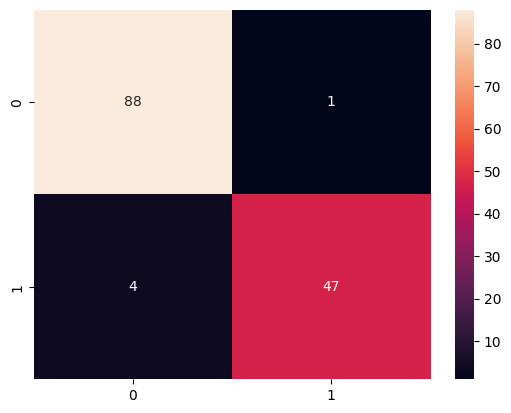

In [ ]:
print(df[label].value_counts())
print()
print('score: ',modelo.score(xtest, ytest))

print('recall_score: ',recall_score(prediccion,ytest, average='micro'))
print('accuracy_score: ',accuracy_score(prediccion,ytest))
print('f1_score: ',f1_score(prediccion,ytest, average='micro'))
print()
print('classification_report: ',classification_report(prediccion,ytest), sep='\n')
# si esta desbalancead recall
cf = confusion_matrix(prediccion,ytest)
sns.heatmap(cf, annot=True)

## Arboles de decicion

In [ ]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
from IPython.display import Image
import pydotplus

In [ ]:
dtc = DecisionTreeClassifier(max_depth=6, class_weight='balanced')
modelo = dtc.fit(xtrain, ytrain) # sample_weight=sample_weights
prediccion = modelo.predict(xtest)

In [ ]:
# ytest = prediccion
prediccion_list = prediccion.tolist()
ytest_lista = ytest.tolist()
i = 0
for p in prediccion_list:
  print(p, ytest_lista[i])
  i += 1

Benign       456
malignant    240
Name: Class, dtype: int64

score:  0.9357142857142857
recall_score:  0.9357142857142857
accuracy_score:  0.9357142857142857
f1_score:  0.9357142857142857
classification_report: 
              precision    recall  f1-score   support

           0       0.96      0.95      0.95        93
           1       0.90      0.91      0.91        47

    accuracy                           0.94       140
   macro avg       0.93      0.93      0.93       140
weighted avg       0.94      0.94      0.94       140



<Axes: >

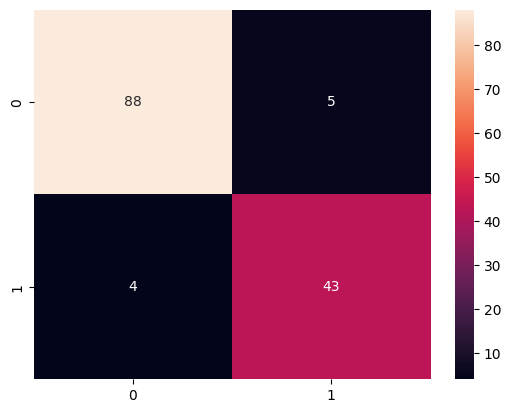

In [ ]:
print(df[label].value_counts())
print()
print('score: ',modelo.score(xtest, ytest))

print('recall_score: ',recall_score(prediccion,ytest, average='micro'))
print('accuracy_score: ',accuracy_score(prediccion,ytest))
print('f1_score: ',f1_score(prediccion,ytest, average='micro'))
print('classification_report: ',classification_report(prediccion,ytest), sep='\n')
# si esta desbalancead recall
cf = confusion_matrix(prediccion,ytest)
sns.heatmap(cf, annot=True)

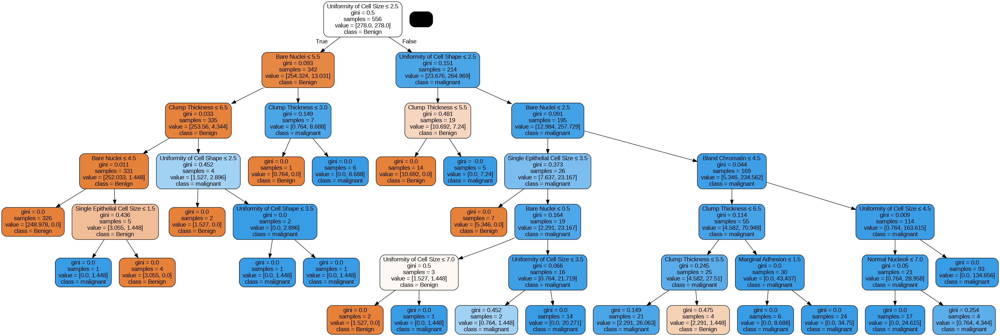

In [ ]:
dot_data = export_graphviz(modelo, out_file=None, feature_names=features, class_names=df[label].unique(), filled=True, rounded=True, special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

## GradientBoostingClassifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
gbc = GradientBoostingClassifier()
modelo = gbc.fit(xtrain, ytrain, sample_weight=sample_weights)
prediccion = modelo.predict(xtest)

Benign       456
malignant    240
Name: Class, dtype: int64

score:  0.95
recall_score:  0.95
accuracy_score:  0.95
f1_score:  0.9500000000000001
classification_report: 
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        89
           1       0.96      0.90      0.93        51

    accuracy                           0.95       140
   macro avg       0.95      0.94      0.95       140
weighted avg       0.95      0.95      0.95       140



<Axes: >

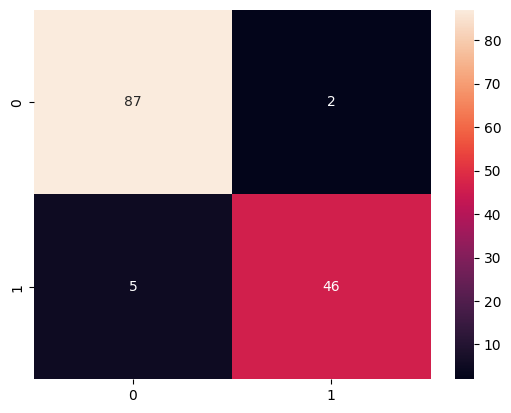

In [ ]:
print(df[label].value_counts())
print()
print('score: ',modelo.score(xtest, ytest))

print('recall_score: ',recall_score(prediccion,ytest, average='micro'))
print('accuracy_score: ',accuracy_score(prediccion,ytest))
print('f1_score: ',f1_score(prediccion,ytest, average='micro'))
print('classification_report: ',classification_report(prediccion,ytest), sep='\n')
# si esta desbalancead recall
cf = confusion_matrix(prediccion,ytest)
sns.heatmap(cf, annot=True)

# Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

modelo = GaussianNB()
modelo.fit(xtrain, ytrain, sample_weight=sample_weights)
predictions = modelo.predict(xtest)

Benign       456
malignant    240
Name: Class, dtype: int64

score:  0.9571428571428572
recall_score:  0.95
accuracy_score:  0.95
f1_score:  0.9500000000000001
classification_report: 
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        89
           1       0.96      0.90      0.93        51

    accuracy                           0.95       140
   macro avg       0.95      0.94      0.95       140
weighted avg       0.95      0.95      0.95       140



<Axes: >

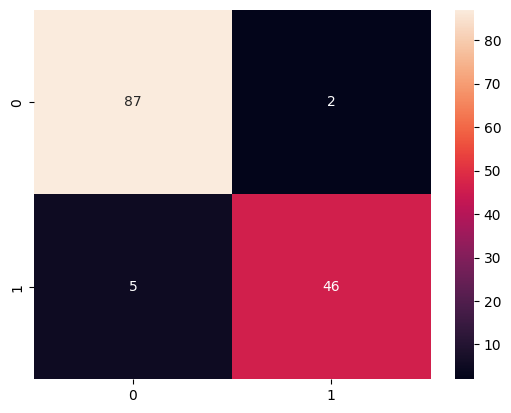

In [ ]:
print(df[label].value_counts())
print()
print('score: ',modelo.score(xtest, ytest))

print('recall_score: ',recall_score(prediccion,ytest, average='micro'))
print('accuracy_score: ',accuracy_score(prediccion,ytest))
print('f1_score: ',f1_score(prediccion,ytest, average='micro'))
print('classification_report: ',classification_report(prediccion,ytest), sep='\n')
# si esta desbalancead recall
cf = confusion_matrix(prediccion,ytest)
sns.heatmap(cf, annot=True)

|    recall    |   SVC     | randomForest | DecisionTree |GradientBoosting|naive bayes|
|--------------|-----------|--------------|--------------|----------------|-----------|
|       0      |   1.00    |     0.99     |    0.95      |     0.98       |   0.98         |   
|       1      |   0.91    |     0.92     |    0.91      |     0.90       |   0.90         |
|   accuracy   |   0.96    |     0.96     |    0.94      |     0.95       |   0.95         |


El mejor clasificador fue random forest y SVC, le sigue naive bayes, Gradient Boosting y por utlimo Decision Tree Classifier, asi que guarde el modelo de random Forest con uno de los mejores accuracy